## UNSUPERVISED LEARNING MINI PROJECT

### CONTEXT

> E-commerce has become a new channel to support businesses development. Through e-commerce, businesses can get access and establish a wider market presence by providing cheaper and more efficient distribution channels for their products or services. E-commerce has also changed the way people shop and consume products and services. Many people are turning to their computers or smart devices to order goods, which can easily be delivered to their homes.

### CONTENT
> This is a sales transaction data set of UK-based e-commerce (online retail) for one year. This London-based shop has been selling gifts and homewares for adults and children through the website since 2007. Their customers come from all over the world and usually make direct purchases for themselves. There are also small businesses that buy in bulk and sell to other customers through retail outlet channels.

> The data set contains 500K rows and 8 columns. The following is the description of each column.

> - **TransactionNo (categorical)**: a six-digit unique number that defines each transaction. The letter “C” in the code indicates a cancellation.
> - **Date (numeric)**: the date when each transaction was generated.
> - **ProductNo (categorical)**: a five or six-digit unique character used to identify a specific product.
> - **Product (categorical)**: product/item name.
> - **Price (numeric)**: the price of each product per unit in pound sterling (£).
> - **Quantity (numeric)**: the quantity of each product per transaction. Negative values related to cancelled transactions.
> - **CustomerNo (categorical)**: a five-digit unique number that defines each customer.
> - **Country (categorical)**: name of the country where the customer resides.

### GOAL

> Gather useful intrinsic information by combining RFM model and some unsupervised learning model. 

> For each segments, analyze the data, and try to answer the following questions:

> - How was the sales trend over the months?
> - What are the most frequent purchased products?
> - How many products does the customer purchase in each transaction?
> - How does each cluster/group contribute to the company's revenue?
> - What are the interval date between transactions?
> - Based on your findings, what strategy could you recommend to the business to gain more profit?
> - ***add more if necessary***

> Also, there is a small percentage of order cancellation in the data set. Most of these cancellations were due to out-of-stock conditions on some products. Under this situation, customers tend to cancel an order as they want all products delivered all at once. 

> Therefore, try to build a supervised learning model to solve this problem.

> Source from UCI Machine Learning Repository: [link to dataset](https://archive.ics.uci.edu/ml/datasets/online+retail)

## OVERVIEW

In [2]:
# import all necessary library
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

> Here we will inspect the data for quality checking.

In [3]:
# load data
df = pd.read_excel("https://archive.ics.uci.edu/ml/machine-learning-databases/00352/Online%20Retail.xlsx")

In [4]:
# check head
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [5]:
#### check datatype
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


> We can see that there are 2 features with missing values (null).

In [6]:
# check null
df.isna().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

## PREPROCESSING

> Since many of the missing values is on the important features (CustomerID), and it's considered as an identifier that will plays an important role to the RFM models, therefore we cannot do anything to this other than dropping the values on this features.

In [7]:
# dropna
df = df.dropna()

In [8]:
# check info after dropping
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 406829 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    406829 non-null  object        
 1   StockCode    406829 non-null  object        
 2   Description  406829 non-null  object        
 3   Quantity     406829 non-null  int64         
 4   InvoiceDate  406829 non-null  datetime64[ns]
 5   UnitPrice    406829 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      406829 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 27.9+ MB


> Since the missing values has been handled, next we will try to create a new features (TotalCost) that will play an important role on RFM for monetary value later.

> *TotalCost = Quantity x UnitPrice*.

In [9]:
# create TotalCost
df["TotalCost"] = df["Quantity"]*df["UnitPrice"]

In [10]:
# check new features
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalCost
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34


> Then we will adjust the InvoiceDate format. We will create a new feature for it, so that it will fit the RFM model.

In [11]:
# create new feature and change its type
df["TransactionDate"] = pd.to_datetime(df["InvoiceDate"]).dt.date
df["TransactionDate"] = pd.to_datetime(df["TransactionDate"])

In [12]:
# check new features
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalCost,TransactionDate
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010-12-01
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010-12-01
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01


> We will also prepare the 'target' feature for supervised prediction later.

In [13]:
# prepare target feature, 1 : cancelled order, 0 : completed order
cancel = []
for i in df["InvoiceNo"]:
    if str(i).startswith("C"):
        cancel.append(1)
    else:
        cancel.append(0)

In [14]:
# apply target
df["cancelled"] = cancel

In [15]:
# check info
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 406829 entries, 0 to 541908
Data columns (total 11 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   InvoiceNo        406829 non-null  object        
 1   StockCode        406829 non-null  object        
 2   Description      406829 non-null  object        
 3   Quantity         406829 non-null  int64         
 4   InvoiceDate      406829 non-null  datetime64[ns]
 5   UnitPrice        406829 non-null  float64       
 6   CustomerID       406829 non-null  float64       
 7   Country          406829 non-null  object        
 8   TotalCost        406829 non-null  float64       
 9   TransactionDate  406829 non-null  datetime64[ns]
 10  cancelled        406829 non-null  int64         
dtypes: datetime64[ns](2), float64(3), int64(2), object(4)
memory usage: 37.2+ MB


> Now that we've finished the preprocess, we will copy the data and then start to build the rfm model.

In [16]:
# create copy for rfm modeling
df1 = df.copy()

## RFM MODEL BUILDING

> First, we need to make RFM table that contains Recency, Frequency, and Monetary group by CustomerID

In [17]:
# last transaction date on invoice
now = pd.to_datetime(df['TransactionDate'].max())

In [18]:
# get customers last transaction date
recency = df.groupby(by='CustomerID', as_index=False)['TransactionDate'].max()
recency.columns = ['CustomerID', 'last_trans_date']

# calculate recency
recency['last_trans_date'] = pd.to_datetime(recency['last_trans_date'])
recency['recency'] = recency['last_trans_date'].apply(lambda x: (now - x).days)

In [19]:
recency.head()

,CustomerID,last_trans_date,recency
0,12346.0,2011-01-18,325
1,12347.0,2011-12-07,2
2,12348.0,2011-09-25,75
3,12349.0,2011-11-21,18
4,12350.0,2011-02-02,310


In [20]:
# calculate frequency
frequency = pd.DataFrame()
frequency['CustomerID'] = [i for i in df['CustomerID'].unique()]
frequency['frequency'] = df.groupby('CustomerID')['CustomerID'].transform('count')

In [21]:
# frequency table
frequency.head()

,CustomerID,frequency
0,17850.0,312.0
1,13047.0,312.0
2,12583.0,312.0
3,13748.0,312.0
4,15100.0,312.0


In [22]:
# calculate monetary
monetary = df.groupby(by='CustomerID', as_index=False).agg({'TotalCost': 'sum'})
monetary.columns = ['CustomerID', 'monetary']

In [23]:
# monetary table
monetary.head()

,CustomerID,monetary
0,12346.0,0.00
1,12347.0,4310.00
2,12348.0,1797.24
3,12349.0,1757.55
4,12350.0,334.40


In [24]:
# create rfm table
rf = pd.merge(recency, frequency, on = "CustomerID")
rfm = pd.merge(rf, monetary, on = "CustomerID")

In [25]:
# hasil tabel rfm
rfm.head()

,CustomerID,last_trans_date,recency,frequency,monetary
0,12346.0,2011-01-18,325,180.0,0.00
1,12347.0,2011-12-07,2,180.0,4310.00
2,12348.0,2011-09-25,75,123.0,1797.24
3,12349.0,2011-11-21,18,258.0,1757.55
4,12350.0,2011-02-02,310,5903.0,334.40


In [26]:
# split rfm quantiles
quantiles = rfm.quantile(q=[0.25,0.5,0.75])
quantiles

,CustomerID,recency,frequency,monetary
0.25,13812.75,16.0,67.0,293.3625
0.50,15300.50,50.0,143.0,648.0750
0.75,16778.25,143.0,312.0,1611.7250


In [27]:
# function to get quantiles score
# arguments : (x = value, p = recency, monetary_value, frequency, k = quartiles dict)

def RScore(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]: 
        return 3
    else:
        return 4
    
def FMScore(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 1

In [28]:
# rfm segmentation score
rfm['R_Quartile'] = rfm['recency'].apply(RScore, args=('recency',quantiles))
rfm['F_Quartile'] = rfm['frequency'].apply(FMScore, args=('frequency',quantiles))
rfm['M_Quartile'] = rfm['monetary'].apply(FMScore, args=('monetary',quantiles))

In [29]:
# calculate rfm score
rfm['RFMScore'] =  rfm["R_Quartile"].map(str) + rfm["F_Quartile"].map(str) + rfm["M_Quartile"].map(str)

In [30]:
# rfm segmentation table
rfm.head()

,CustomerID,last_trans_date,recency,frequency,monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore
0,12346.0,2011-01-18,325,180.0,0.00,4,2,4,424
1,12347.0,2011-12-07,2,180.0,4310.00,1,2,1,121
2,12348.0,2011-09-25,75,123.0,1797.24,3,3,1,331
3,12349.0,2011-11-21,18,258.0,1757.55,2,2,1,221
4,12350.0,2011-02-02,310,5903.0,334.40,4,1,3,413


> REFERENSI : https://www.blastanalytics.com/blog/rfm-analysis-boosts-sales

In [31]:
# set segment name, urutannya dari atas
segname=[]
for i,j,k in zip(rfm["RFMScore"], rfm["F_Quartile"], rfm["M_Quartile"]):
    if i == "111":
        segname.append("Best Customers")
    elif i == "311":
        segname.append("Almost Lost")
    elif i == "411":
        segname.append("Lost Customers")
    elif i == "444":
        segname.append("Lost Cheap Customers")
    elif j == 1:
        segname.append("Loyal Customers")
    elif k == 1:
        segname.append("Big Spenders")
    else:
        segname.append("Other")

In [32]:
# get segment name
rfm["segment"] = segname

In [33]:
# rfm final
rfm.head()

,CustomerID,last_trans_date,recency,frequency,monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,segment
0,12346.0,2011-01-18,325,180.0,0.00,4,2,4,424,Other
1,12347.0,2011-12-07,2,180.0,4310.00,1,2,1,121,Big Spenders
2,12348.0,2011-09-25,75,123.0,1797.24,3,3,1,331,Big Spenders
3,12349.0,2011-11-21,18,258.0,1757.55,2,2,1,221,Big Spenders
4,12350.0,2011-02-02,310,5903.0,334.40,4,1,3,413,Loyal Customers


> contoh lakukan analisis sederhana:

In [34]:
# jumlah masing2 segment
cnt_seg = rfm.groupby("segment", as_index=False)["CustomerID"].nunique().sort_values(by = "CustomerID", ascending=False).reset_index()

In [35]:
# tambahkan kolom percentage
cnt_seg["pct"] = round(cnt_seg["CustomerID"]/sum(cnt_seg["CustomerID"]) *100, 1)

In [36]:
# cek hasil
cnt_seg

,index,segment,CustomerID,pct
0,6,Other,1757,40.2
1,5,Loyal Customers,1554,35.5
2,2,Big Spenders,654,15.0
3,1,Best Customers,216,4.9
4,3,Lost Cheap Customers,89,2.0
5,0,Almost Lost,81,1.9
6,4,Lost Customers,21,0.5


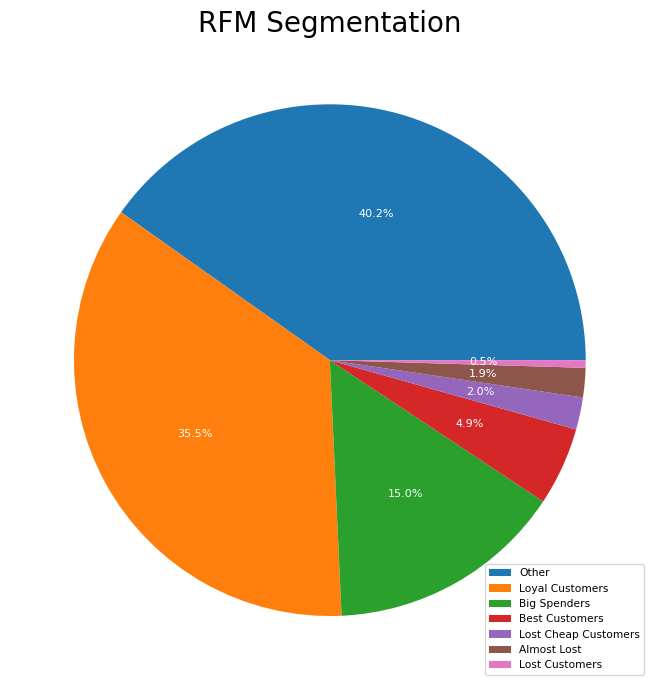

In [37]:
# visualisasi hasil
plt.figure(figsize=(7,7))
plt.pie(cnt_seg["CustomerID"], 
        autopct = '%.1f%%', 
        textprops = {'fontsize' : 8, 
                     'color' : 'white'})
plt.title("RFM Segmentation", fontsize=20)
plt.legend(cnt_seg["segment"], loc='lower right', prop={'size': 7.7})
plt.tight_layout()
plt.show()

In [38]:
# takeout other
seg_new = cnt_seg[cnt_seg["segment"]!="Other"]

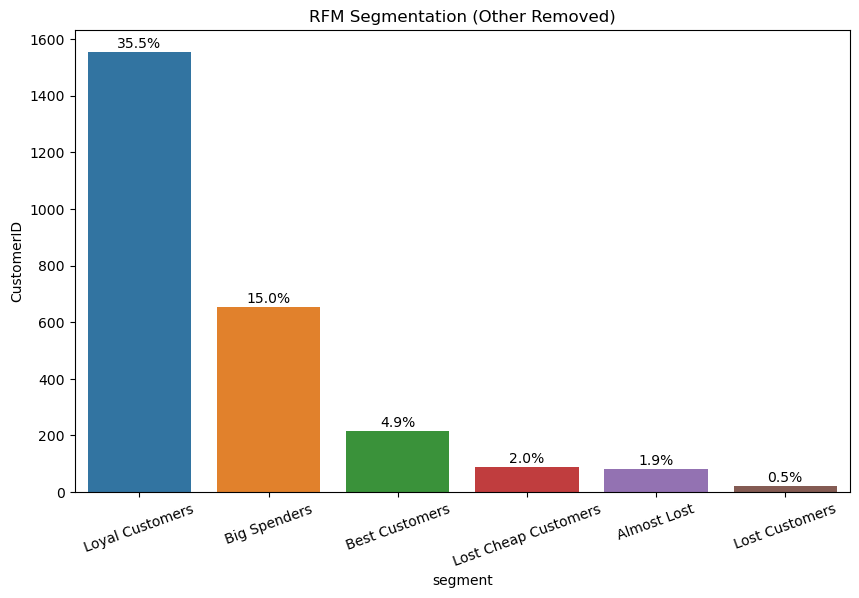

In [39]:
# visualisasi dengan barplot (takeout other segment)
plt.figure(figsize=(10,6))
x = seg_new["segment"]
y = seg_new["CustomerID"]
percentage = [i for i in seg_new["pct"]]
ax = sns.barplot(x=x, y=y)
patches = ax.patches
for i in range(len(patches)):
    x = patches[i].get_x() + patches[i].get_width()/2
    y = patches[i].get_height()+15
    ax.annotate(f'{percentage[i]}%', (x, y), ha='center')
plt.title("RFM Segmentation (Other Removed)")
plt.xticks(rotation=20)
plt.show()

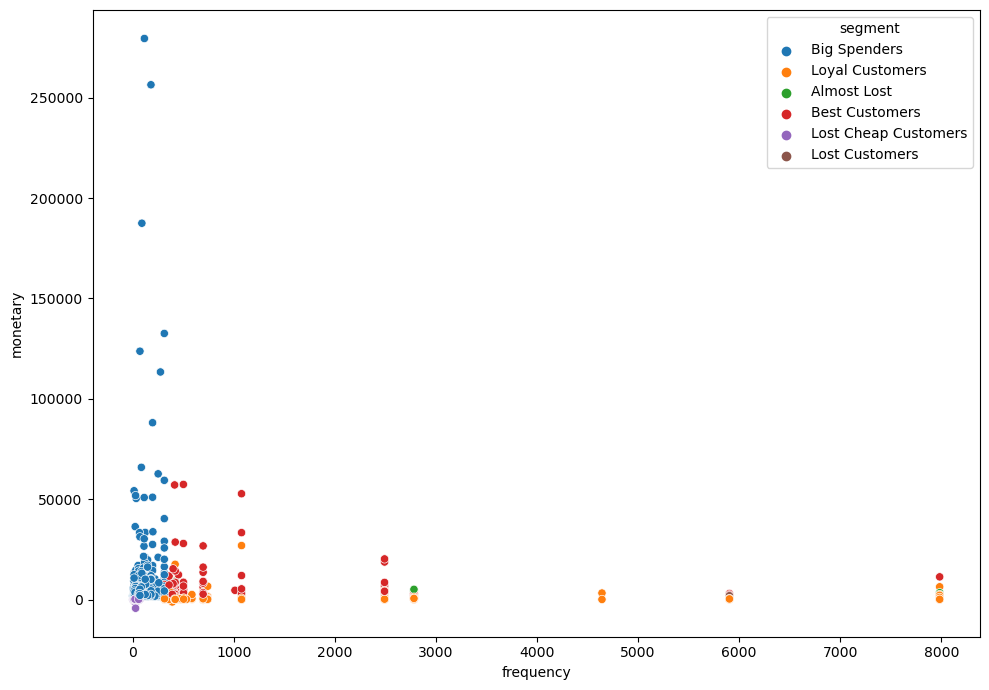

In [40]:
# visualisasi dengan scatter (takeout other segment)
plt.figure(figsize=(10,7))
sns.scatterplot(data=rfm[rfm["segment"]!="Other"], 
                x="frequency", 
                y="monetary", 
                hue="segment")
plt.tight_layout()
plt.show()

## CLUSTERING

> `Then after rfm, we cluster to simplify clusters'

> `we use K-means to cluster the data by means`

> `try recency vs monetary pick the proper feature`

In [131]:
### import the needed libraries

In [43]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import RobustScaler
from sklearn import metrics

# Library untuk clustering
import scipy.cluster.hierarchy as sch
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.neighbors import NearestNeighbors
from scipy.spatial.distance import cdist

# Library untuk DB Index untuk mengukur hasil clustering
from sklearn.metrics import davies_bouldin_score

In [44]:
# ubah menjadi bentuk array
X1 = np.asarray(rfm[["recency", "monetary"]])
X2 = np.asarray(rfm[["recency", "frequency"]])
X3 = np.asarray(rfm[["recency", "monetary"]])

In [45]:
# range k dari Kmeans
k = range(1, 10)
inertia = [] 
for i in k:
    model = KMeans(n_clusters = i, max_iter = 1000, random_state=0) # jumlah cluster akan di loop sebanyak k range(9 times)
    model.fit(X1)
    inertia.append(model.inertia_)

In [46]:
# cek inertia
for i,j in enumerate(inertia):
    print(f"iterasi {i} - inertia = {j}")

iterasi 0 - inertia = 295338808219.3727
iterasi 1 - inertia = 100057878094.20789
iterasi 2 - inertia = 49222777286.93033
iterasi 3 - inertia = 30246399058.472115
iterasi 4 - inertia = 17858016241.76866
iterasi 5 - inertia = 11668509630.05867
iterasi 6 - inertia = 8467881253.409412
iterasi 7 - inertia = 5504603249.735126
iterasi 8 - inertia = 4082218715.3147964


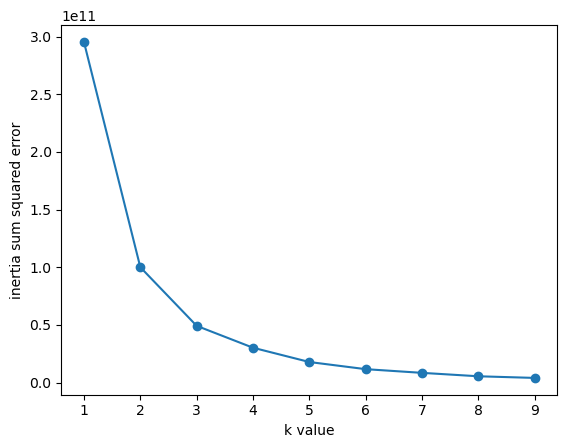

In [47]:
# plot elbow curve
plt.plot(k, inertia, "o-")
plt.xlabel('k value')
plt.ylabel('inertia sum squared error')
plt.show()

In [48]:
# fit model KMeans
model_km = KMeans(n_clusters = 4, max_iter = 1000, random_state=0)
model_km.fit(X1)

KMeans(max_iter=1000, n_clusters=4, random_state=0)

In [49]:
# preditct clusters
rfm["cluster_km1"] = model_km.predict(X1)

In [50]:
# cek hasil
rfm.head()

,CustomerID,last_trans_date,recency,frequency,monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,segment,cluster_km1
0,12346.0,2011-01-18,325,180.0,0.00,4,2,4,424,Other,0
1,12347.0,2011-12-07,2,180.0,4310.00,1,2,1,121,Big Spenders,0
2,12348.0,2011-09-25,75,123.0,1797.24,3,3,1,331,Big Spenders,0
3,12349.0,2011-11-21,18,258.0,1757.55,2,2,1,221,Big Spenders,0
4,12350.0,2011-02-02,310,5903.0,334.40,4,1,3,413,Loyal Customers,0


In [51]:
# counts tiap clusters
rfm["cluster_km1"].value_counts()

0    4252
3     102
2      15
1       3
Name: cluster_km1, dtype: int64

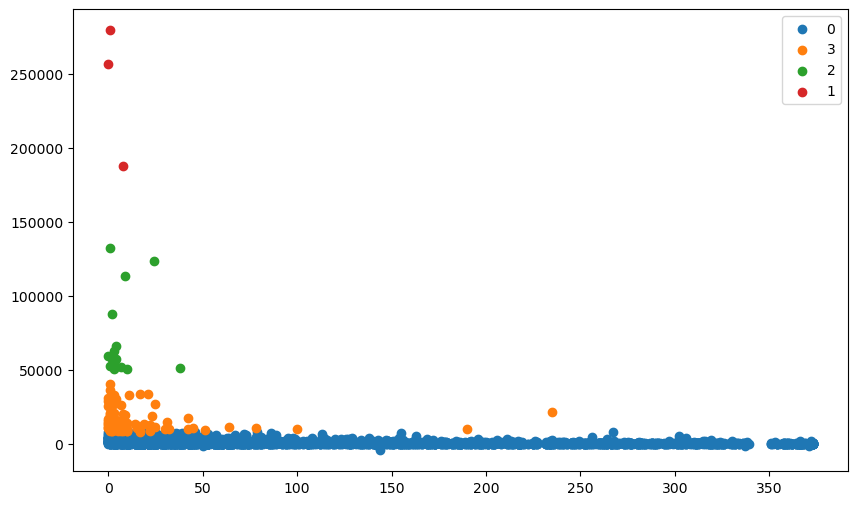

In [52]:
# plot hasil kmeans
plt.figure(figsize=(10,6))
# ax = fig.add _subplot(111, projection='3d')
for i in rfm["cluster_km1"].unique():
    plt.scatter(rfm["recency"][rfm["cluster_km1"] == i], rfm["monetary"][rfm["cluster_km1"] == i], label = i)
plt.legend()
plt.show()

> From the graph above it can be concluded that:
>- Cluster 0 is a type of customer that has low monetary and various recencies.
>- Cluster 1 is a type of customer who has moderate monetary and recency is between 0-250.
>- Cluster 2 is a type of customer who has a fairly high monetary level of around 50000 - 140000 and recency is below 50.
>- Cluster 3 is a type of customer who has high monetary and recency below 50.

## EXPLORATORY DATA ANALYSIS

> For each segments, analyze the data, and try to answer the following questions:

> - How was the sales trend over the months?
> - What are the most frequent purchased products?
> - How many products does the customer purchase in each transaction?
> - How does each cluster/group contribute to the company's revenue?
> - What are the interval date between transactions?
> - Based on your findings, what strategy could you recommend to the business to gain more profit?

In [54]:
# gabung ke DataFrame
res = pd.merge(df1, rfm, on = "CustomerID")

In [55]:
res.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalCost,TransactionDate,...,last_trans_date,recency,frequency,monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,segment,cluster_km1
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010-12-01,...,2011-02-10,302,312.0,5288.63,4,2,1,421,Big Spenders,0
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,...,2011-02-10,302,312.0,5288.63,4,2,1,421,Big Spenders,0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010-12-01,...,2011-02-10,302,312.0,5288.63,4,2,1,421,Big Spenders,0
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,...,2011-02-10,302,312.0,5288.63,4,2,1,421,Big Spenders,0
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12-01,...,2011-02-10,302,312.0,5288.63,4,2,1,421,Big Spenders,0


In [56]:
res.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'TotalCost', 'TransactionDate',
       'cancelled', 'last_trans_date', 'recency', 'frequency', 'monetary',
       'R_Quartile', 'F_Quartile', 'M_Quartile', 'RFMScore', 'segment',
       'cluster_km1'],
      dtype='object')

In [57]:
res['year_month'] = pd.to_datetime(res['TransactionDate']).dt.to_period('M')
res.tail()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalCost,TransactionDate,...,recency,frequency,monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,segment,cluster_km1,year_month
406824,581578,22993,SET OF 4 PANTRY JELLY MOULDS,12,2011-12-09 12:16:00,1.25,12713.0,Germany,15.00,2011-12-09,...,0,452.0,848.55,1,1,2,112,Loyal Customers,0,2011-12
406825,581578,22907,PACK OF 20 NAPKINS PANTRY DESIGN,12,2011-12-09 12:16:00,0.85,12713.0,Germany,10.20,2011-12-09,...,0,452.0,848.55,1,1,2,112,Loyal Customers,0,2011-12
406826,581578,22908,PACK OF 20 NAPKINS RED APPLES,12,2011-12-09 12:16:00,0.85,12713.0,Germany,10.20,2011-12-09,...,0,452.0,848.55,1,1,2,112,Loyal Customers,0,2011-12
406827,581578,23215,JINGLE BELL HEART ANTIQUE SILVER,12,2011-12-09 12:16:00,2.08,12713.0,Germany,24.96,2011-12-09,...,0,452.0,848.55,1,1,2,112,Loyal Customers,0,2011-12
406828,581578,22736,RIBBON REEL MAKING SNOWMEN,10,2011-12-09 12:16:00,1.65,12713.0,Germany,16.50,2011-12-09,...,0,452.0,848.55,1,1,2,112,Loyal Customers,0,2011-12


### How was the sales trend over the months ?

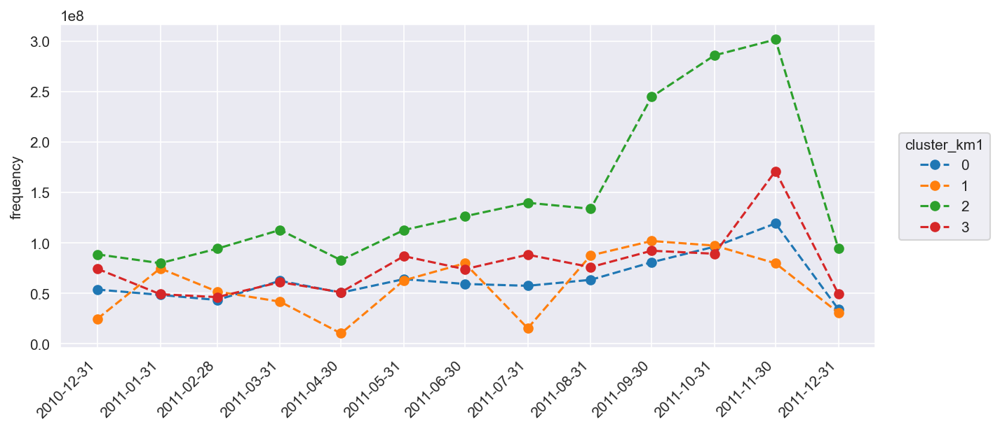

In [58]:
with sns.axes_style("darkgrid"):
    plt.figure(figsize=(10,4),dpi=150)
    for i in np.sort(res["cluster_km1"].unique()):
        temp_res = res[res["cluster_km1"] == i].set_index(pd.to_datetime(res[res["cluster_km1"] == i]["TransactionDate"])).resample("M").sum()[["monetary"]]
        plt.plot(temp_res.index,temp_res.values,label=i,marker="o",linestyle="--")
        plt.xticks(temp_res.index,ha="right",rotation=45)
    plt.ylabel("frequency")
    plt.legend(bbox_to_anchor=(1.02,0.5),loc="center left",title="cluster_km1")
    plt.show()

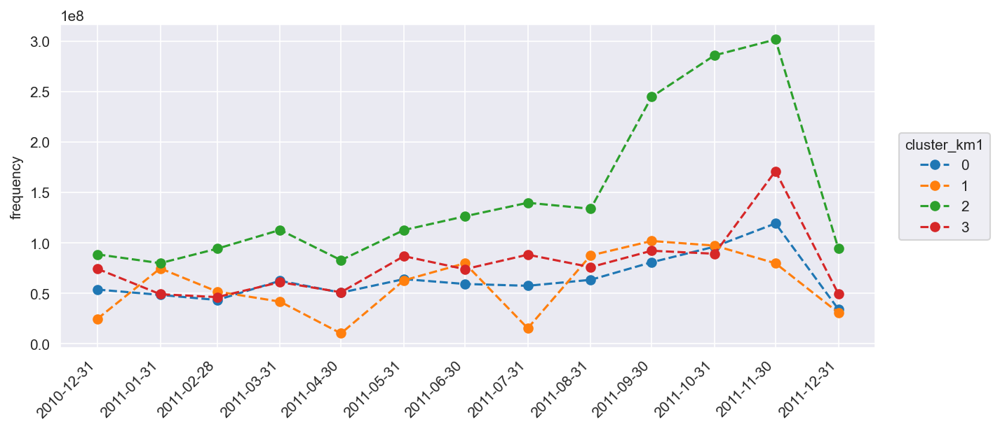

In [59]:
with sns.axes_style("darkgrid"):
    plt.figure(figsize=(10,4),dpi=150)
    for i in np.sort(res["cluster_km1"].unique()):
        temp_res = res[res["cluster_km1"] == i].set_index(pd.to_datetime(res[res["cluster_km1"] == i]["TransactionDate"])).resample("M").sum()[["monetary"]]
        plt.plot(temp_res.index,temp_res.values,label=i,marker="o",linestyle="--")
        plt.xticks(temp_res.index,ha="right",rotation=45)
    plt.ylabel("frequency")
    plt.legend(bbox_to_anchor=(1.02,0.5),loc="center left",title="cluster_km1")
    plt.show()

> From the graph above it can be seen that:
>- the trend of sales frequency in cluster 0 can be seen quite stable and tends to increase every month even though there was a decline at the end of the year
>- in each cluster, there was a decrease in sales at the end of the year

### What are the most frequent purchased products?

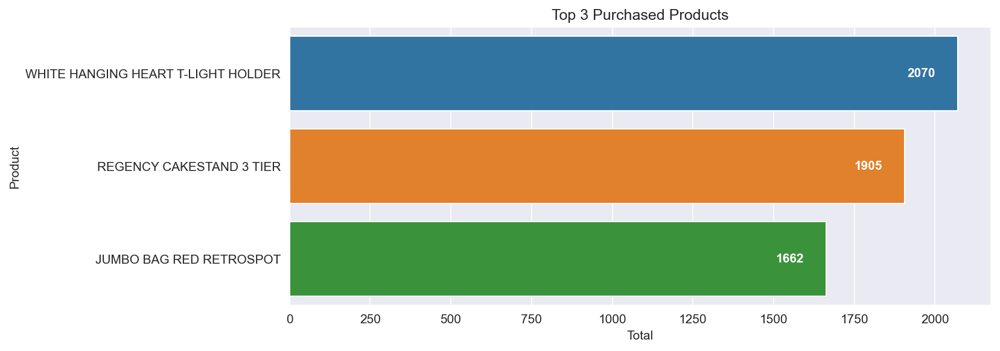

In [60]:
# Top 3 product (total)

with sns.axes_style("darkgrid"):
    plt.figure(figsize=(10,4),dpi=150)
    countplot = sns.countplot(data=res,y='Description',order=res['Description'].value_counts().head(3).index)
    for i in countplot.containers:
        countplot.bar_label(i,padding=-40,color="white",fontweight="bold")
    plt.title('Top 3 Purchased Products')
    plt.xlabel('Total')
    plt.ylabel('Product')
    plt.show()

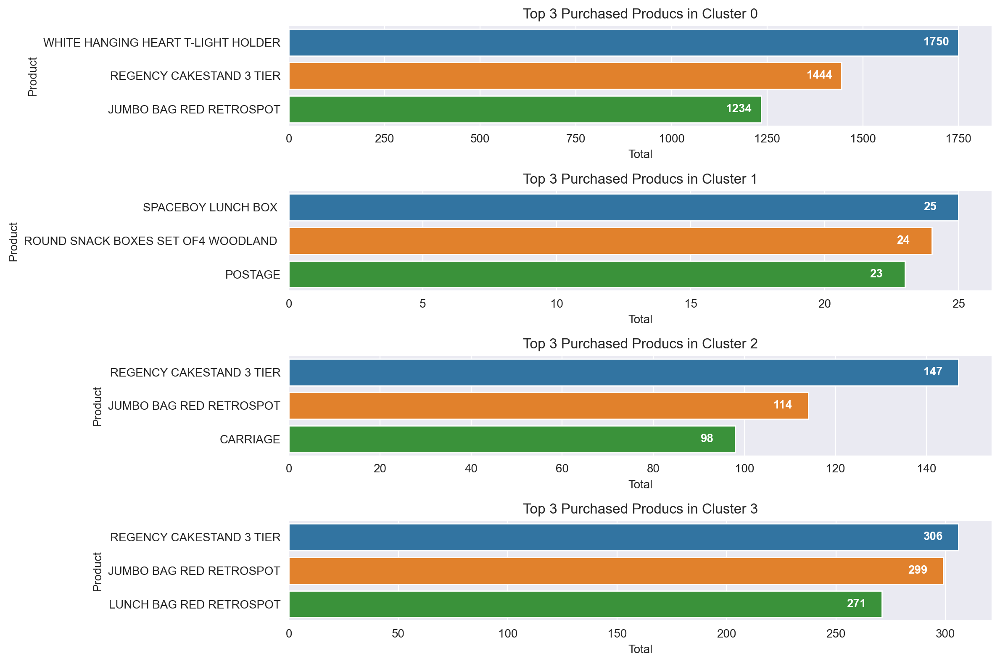

In [61]:
# Top 3 produk (setiap cluster)

with sns.axes_style("darkgrid"):
    nrows,ncols = 4,1
    fig,ax = plt.subplots(figsize=(12,8),dpi=200,nrows=nrows,ncols=ncols)
    for i,j in zip(range(nrows),np.sort(res["cluster_km1"].unique())):
        countplot = sns.countplot(
            data=res[res["cluster_km1"] == j],
            y='Description',
            order=res[res["cluster_km1"] == j]['Description'].value_counts().head(3).index,
            ax=ax[i]
        )
        for _ in countplot.containers:
            countplot.bar_label(_,padding=-30,color="white",fontweight="bold")
        ax[i].set_title(f"Top 3 Purchased Producs in Cluster {j}")
        ax[i].set_xlabel("Total")
        ax[i].set_ylabel("Product")
    plt.tight_layout()
    plt.show()

> Overall, the 3 most purchased products are the White Hanging Heart T-Light Holder, Regency Cakestand 3 Tier, and Jumbo Bag Retrospot.

> In cluster 0, it turns out that the White Hanging Heart T-Light Holder is the most purchased product, meaning that overall the dominant purchase of this product is in cluster 0

> In cluster 1, you can see the most purchased product, namely the Spacebox Lunch Box. However, if you look at the number of purchases, cluster 1 is the cluster with the smallest purchase contribution when compared to other clusters

> In cluster 2, the most purchased products are Regency Cakestand, Jumbo Bag and Carriage

> Similar to cluster 2, the most popular items in cluster 3 are the Regency Cakestand and the Jumbo Bag red.

### How does each cluster/group contribute to the company's revenue?

In [62]:
import plotly.express as px

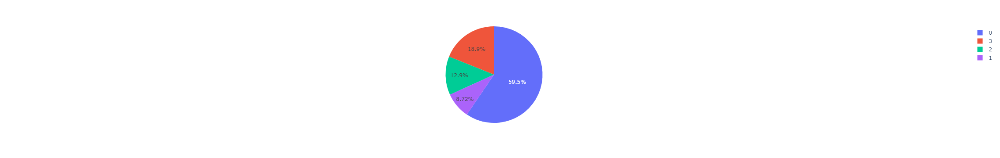

In [132]:
labels = res["cluster_km1"]
values = res["TotalCost"]
fig1 = px.pie(labels, values=values, names=labels)

fig1.show()

> According to the graph above, cluster 0 contributes a sizable amount of revenue to the company, amounting to about 59,5%, followed by cluster 3 at about 18,9%, cluster 2 at about 12,9%, and cluster 1 at about 8,72%.

### How many products does the customer purchase in each transaction?

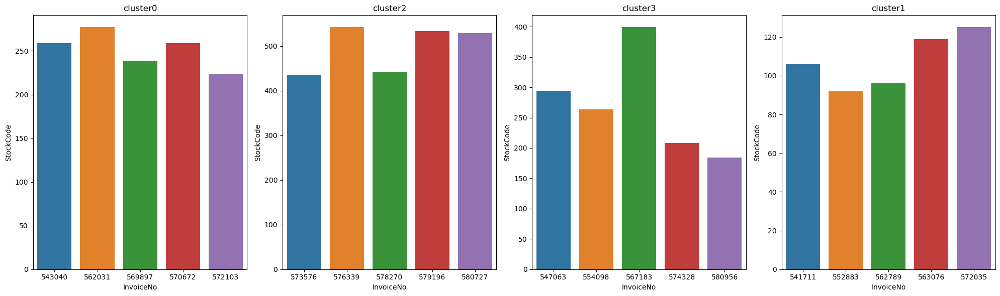

In [64]:
# Top 5 product (total)
fig, axs = plt.subplots(nrows = 1, ncols = 4, figsize = (20,6))
col = 0
for i in res ['cluster_km1'].unique():
    axs[col].set_title(f'cluster{i}')
    z = res[res['cluster_km1'] == i].groupby(by=['InvoiceNo', 'CustomerID'])['StockCode'].count().sort_values(ascending=False).reset_index().head(5)
    sns.barplot(data=z, x='InvoiceNo', y='StockCode', ax=axs[col])
    col+=1
plt.tight_layout()
plt.show()

In [65]:
for i in res['cluster_km1'].unique():
    print(f'cluster {i}')
    print(res[res['cluster_km1'] == i].groupby(by=['InvoiceNo', 'CustomerID'])['StockCode'].count().sort_values(ascending=False).reset_index().head(5))
    print('\n')

cluster 0
  InvoiceNo  CustomerID  StockCode
0    562031     16984.0        277
1    543040     17337.0        259
2    570672     12536.0        259
3    569897     17813.0        239
4    572103     17571.0        223


cluster 2
  InvoiceNo  CustomerID  StockCode
0    576339     14096.0        542
1    579196     14096.0        533
2    580727     14096.0        529
3    578270     14096.0        442
4    573576     14096.0        435


cluster 3
  InvoiceNo  CustomerID  StockCode
0    567183     14769.0        399
1    547063     14769.0        294
2    554098     14769.0        264
3    574328     13081.0        208
4    580956     17841.0        184


cluster 1
  InvoiceNo  CustomerID  StockCode
0    572035     14646.0        125
1    563076     14646.0        119
2    541711     14646.0        106
3    562789     14646.0         96
4    552883     14646.0         92




In [134]:

res.groupby(['InvoiceNo','CustomerID','cluster_km1'], as_index = False)['recency'].agg(np.sum).sort_values(by='recency', ascending = False)

,InvoiceNo,CustomerID,cluster_km1,recency
1477,540247,15464.0,0,53066
1552,540458,12501.0,0,46935
2146,542107,16222.0,0,43566
2498,543040,17337.0,0,39109
359,537144,15880.0,0,38745
...,...,...,...,...
14743,572885,15311.0,2,0
14740,572881,12748.0,3,0
14703,572835,17428.0,3,0
14702,572834,12748.0,3,0


> Then it can be concluded that:

> For cluster 0
>- The number of products that were purchased the most in one transaction was 277 purchased by CustomerID 16984

> For cluster 2
>- The number of products that were purchased the most in one transaction was 542 purchased by CustomerID 14096

> For cluster 3
>- The number of products that were purchased the most in one transaction was 399 purchased by CustomerID 14769

> For cluster 1
>- The number of products that were purchased the most in one transaction was 125 purchased by CustomerID 14646

### What are the interval date between transactions?

In [66]:
res.groupby(by='cluster_km1')['recency'].max()-res.groupby(by='cluster_km1')['recency'].min()

cluster_km1
0    373
1      8
2     38
3    235
Name: recency, dtype: int64

> From the calculation above it can be seen that cluster 0 has the largest interval value, namely 373, the second order is cluster 3 of 235, the third order is cluster 2 of 38, the last is cluster 1 of 8.

In [67]:
res.groupby(['InvoiceNo','CustomerID','cluster_km1'], as_index = False)['cancelled'].agg(np.sum).sort_values(by='cancelled', ascending = False)

,InvoiceNo,CustomerID,cluster_km1,cancelled
21437,C570867,12607.0,0,101
20584,C560540,12415.0,2,57
19578,C548460,16801.0,0,45
20613,C560855,14410.0,0,41
21430,C570828,14911.0,2,39
...,...,...,...,...
7396,555108,18231.0,0,0
7395,555107,12594.0,0,0
7394,555106,12790.0,0,0
7393,555104,17949.0,2,0


## How Cancellation and Customer Cluster Related?

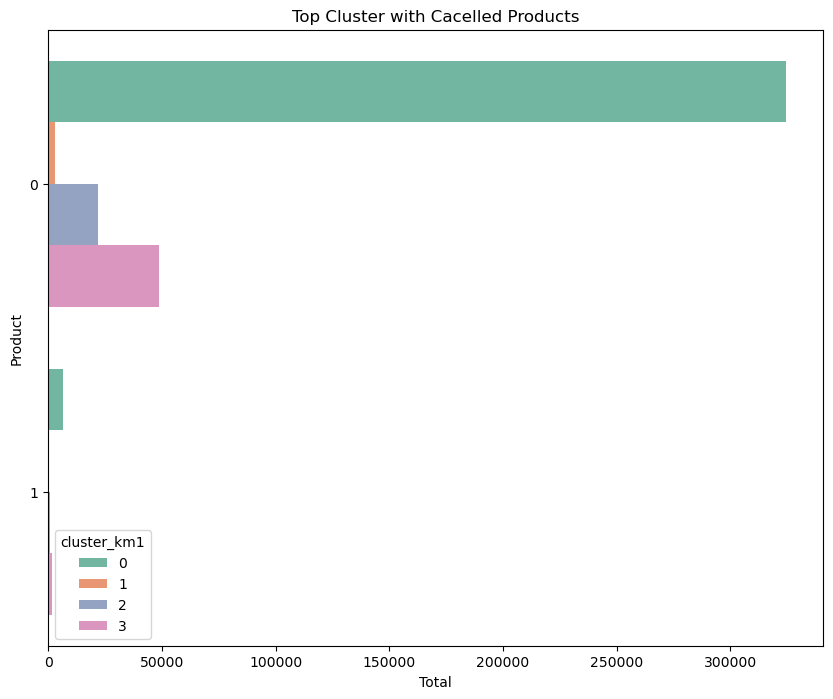

In [68]:

plt.figure(figsize=(10,8))
sns.countplot(data=res, y='cancelled', palette="Set2", hue = 'cluster_km1')
plt.title('Top Cluster with Cacelled Products')
plt.xlabel('Total')
plt.ylabel('Product')
plt.show()

In [69]:
res.groupby(by='cluster_km1')['cancelled'].agg(np.sum).sort_values( ascending = False)

cluster_km1
0    6634
3    1571
2     679
1      21
Name: cancelled, dtype: int64

The cancellation concentrated on cluster 0 followed by clusters 3,2, and 1. 

### Based on your findings, what strategy could you recommend to the business to gain more profit?

>- We could offer a discount on the top 3 most popular items, such as the T-Heart Holder, Regency cakestand 3 tier, and big bag retrospot, for cluster 0 customers who have a high cancellation rate and make up the majority of the population.
>- For cluster 1 (The Best Customers) with high quantity purchases, high total costs, and high recency, we could create bundle promotions to motivate them and loyalty points for their regular purchases and large spends; the bundling/discount includes the top 3 products, which are the spaceboy lunch box, round snack box set of 4 boxes, and postage.
>- The top 3 things for cluster 2 (the high-spending and a few of the best customers) that we could discount are the regency cakestand with 3 tiers, the gigantic bag in red retrospot, and the carriage
>- Regency Cakestand 3 Tier, Jumbo Bag Red Retrospot, and Lunch Bag Red Retrospot are the top 3 products we could discount for Cluster 3 (The Big Spenders and Some of the Best Customers).

## PREDICTIVE MODEL BUILDING

> To analyze and predict and minimixe the cancaellation rate we need tto crate a model to predict the analysis. We will use stacked ensemble model using randomforestclassifier as final estimator

In [70]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, LabelEncoder, LabelBinarizer, MinMaxScaler, RobustScaler
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, cross_val_score, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, recall_score, roc_auc_score, roc_curve, precision_score, f1_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.datasets import load_breast_cancer

# set up pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from imblearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer, make_column_transformer
from imblearn import FunctionSampler
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss, TomekLinks
from imblearn.combine import SMOTETomek

# ensemble classifier models
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.tree import DecisionTreeClassifier

In [71]:
data = res[['Quantity','TotalCost','recency','frequency','monetary','RFMScore','cluster_km1','cancelled']]

In [72]:
# cek hasil
data.head()

,Quantity,TotalCost,recency,frequency,monetary,RFMScore,cluster_km1,cancelled
0,6,15.30,302,312.0,5288.63,421,0,0
1,6,20.34,302,312.0,5288.63,421,0,0
2,8,22.00,302,312.0,5288.63,421,0,0
3,6,20.34,302,312.0,5288.63,421,0,0
4,6,20.34,302,312.0,5288.63,421,0,0


In [73]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 406829 entries, 0 to 406828
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Quantity     406829 non-null  int64  
 1   TotalCost    406829 non-null  float64
 2   recency      406829 non-null  int64  
 3   frequency    328771 non-null  float64
 4   monetary     406829 non-null  float64
 5   RFMScore     406829 non-null  object 
 6   cluster_km1  406829 non-null  int32  
 7   cancelled    406829 non-null  int64  
dtypes: float64(3), int32(1), int64(3), object(1)
memory usage: 26.4+ MB


In [74]:
data.isna().sum()

Quantity           0
TotalCost          0
recency            0
frequency      78058
monetary           0
RFMScore           0
cluster_km1        0
cancelled          0
dtype: int64

In [75]:
data = data.dropna()

In [76]:
data.replace([np.inf, -np.inf], np.nan, inplace = True)

In [77]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 328771 entries, 0 to 406828
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Quantity     328771 non-null  int64  
 1   TotalCost    328771 non-null  float64
 2   recency      328771 non-null  int64  
 3   frequency    328771 non-null  float64
 4   monetary     328771 non-null  float64
 5   RFMScore     328771 non-null  object 
 6   cluster_km1  328771 non-null  int32  
 7   cancelled    328771 non-null  int64  
dtypes: float64(3), int32(1), int64(3), object(1)
memory usage: 21.3+ MB


In [78]:
# cek target
data["cancelled"].value_counts()

0    321556
1      7215
Name: cancelled, dtype: int64

### Train Test Split

In [79]:
# split target
X = data.drop(['cancelled'], axis=1)
y = data['cancelled']

In [80]:
# trains test split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state=0)

### Feature Engineering

### Scaling

In [81]:
data[["Quantity","TotalCost","recency","frequency","monetary"]] = RobustScaler().fit_transform(data[["Quantity","TotalCost","recency","frequency","monetary"]])

In [82]:
# cek hasil
data.head()

,Quantity,TotalCost,recency,frequency,monetary,RFMScore,cluster_km1,cancelled
0,0.2,0.312704,9.0625,0.651982,0.386108,421,0,0
1,0.2,0.641042,9.0625,0.651982,0.386108,421,0,0
2,0.4,0.749186,9.0625,0.651982,0.386108,421,0,0
3,0.2,0.641042,9.0625,0.651982,0.386108,421,0,0
4,0.2,0.641042,9.0625,0.651982,0.386108,421,0,0


### Modeling

In [83]:
# cek sebelum resampling
print('X_train sebelum Resampling', X_train.shape)
print('y_train sebelum Resampling', y_train.shape, '\n')

print("label '1' sebelum Resampling", sum(y_train == 1))
print("label '0' sebelum Resampling", sum(y_train == 0))

X_train sebelum Resampling (263016, 7)
y_train sebelum Resampling (263016,) 

label '1' sebelum Resampling 5796
label '0' sebelum Resampling 257220


In [84]:
# gunakan SMOTE+tomeklinks
st = SMOTETomek()
X_train_st, y_train_st = st.fit_resample(X_train, y_train)

In [85]:
# cek sesudah resampling
print('X_train sesudah Resampling', X_train_st.shape)
print('y_train sesudah Resampling', y_train_st.shape, '\n')

print("label '1' sesudah Resampling", sum(y_train_st == 1))
print("label '0' sesudah Resampling", sum(y_train_st == 0))

X_train sesudah Resampling (514438, 7)
y_train sesudah Resampling (514438,) 

label '1' sesudah Resampling 257219
label '0' sesudah Resampling 257219


### Model Preparation

In [87]:
from xgboost import XGBClassifier

In [88]:
# Decision Tree with default parameter
DTree = DecisionTreeClassifier().fit(X_train_st, y_train_st)

# Random Forest Classifier with default parameter
RFC = RandomForestClassifier().fit(X_train_st, y_train_st)

### Decision Tree

In [89]:
y_pred_dt = DTree.predict(X_test)

In [90]:
result = pd.DataFrame()
result['y_act'] = y_test
result['y_pred_dt'] = y_pred_dt

In [91]:
result = pd.concat([X_test,result],axis=1)

In [92]:
result.head()

,Quantity,TotalCost,recency,frequency,monetary,RFMScore,cluster_km1,y_act,y_pred_dt
35314,24,10.08,28,359.0,2655.22,211,0,0,0
176722,12,35.40,29,23.0,5842.95,241,0,0,0
284425,12,17.40,16,46.0,5055.79,141,0,0,0
296085,4,15.00,45,133.0,212.54,234,0,0,0
111142,3,14.85,22,58.0,3967.78,241,0,0,0


### Confusion Matrix

In [93]:
print(confusion_matrix(y_test,y_pred_dt))

[[64336     0]
 [    0  1419]]


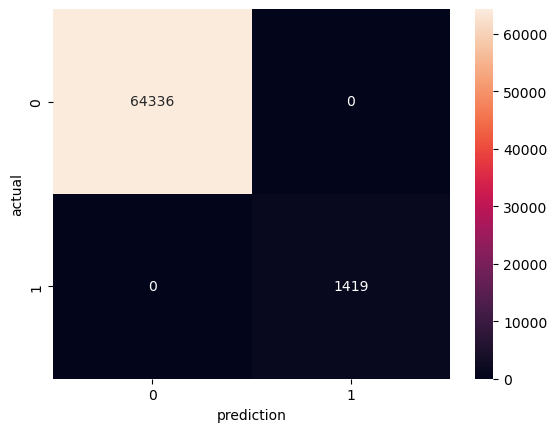

In [94]:
sns.heatmap(confusion_matrix(y_test,y_pred_dt), annot=True, fmt='.0f')
plt.xlabel('prediction')
plt.ylabel('actual')
plt.show()

In [95]:
# cek classification report
print(classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     64336
           1       1.00      1.00      1.00      1419

    accuracy                           1.00     65755
   macro avg       1.00      1.00      1.00     65755
weighted avg       1.00      1.00      1.00     65755



In [96]:
def plot_roc_curve(true_y, y_prob, labels):
    fpr,tpr,thresholds = roc_curve(true_y, y_prob)

    plt.plot(fpr,tpr,label=labels)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')

model AUC Score = 1.0



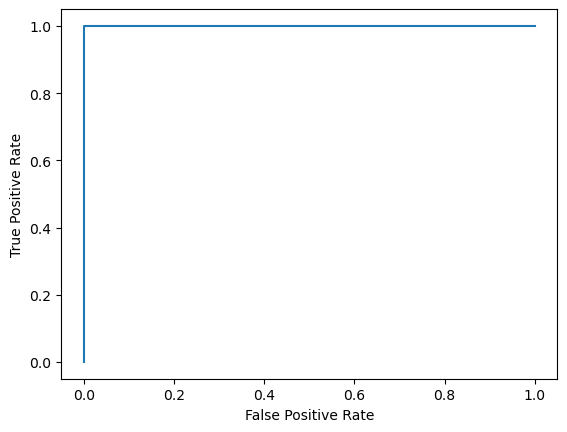

In [97]:
#plot roc auc
plot_roc_curve(y_test,y_pred_dt,'AUC Score')
print(f'model AUC Score = {roc_auc_score(y_test,y_pred_dt)}\n')
plt.show()

In [98]:
# cek model matrices
pd.DataFrame(data = [accuracy_score(y_test, y_pred_dt)*100, recall_score(y_test, y_pred_dt)*100,
                     precision_score(y_test, y_pred_dt)*100, roc_auc_score(y_test, y_pred_dt)*100,
                     f1_score(y_test, y_pred_dt)*100],
             index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
             columns = ['Score (%)']
            )

,Score (%)
accuracy,100.0
recall,100.0
precision,100.0
roc_auc_score,100.0
f1_score,100.0


In [99]:
# cek 1 fold cross val
pd.DataFrame(data = [DTree.score(X_train_st, y_train_st)*100,
                     DTree.score(X_test, y_test)*100],
             index = ['Model Score in Data Train', 'Model Score in Data Test'],
             columns = ['Score (%)']
            )

,Score (%)
Model Score in Data Train,100.0
Model Score in Data Test,100.0


In [100]:
# Check overfit on Decision Tree Classifier

cv = KFold(n_splits = 5, shuffle= True)

DT_kfold = cross_val_score(DTree, X_train_st, y_train_st, cv = cv)
DT_ts_kfold = cross_val_score(DTree, X_test, y_test, cv = cv)

pd.DataFrame({'LR Train kfold' : DT_kfold.tolist(),
             'LR Test kfold' : DT_ts_kfold.tolist(),})

,LR Train kfold,LR Test kfold
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,1.0,1.0
4,1.0,1.0


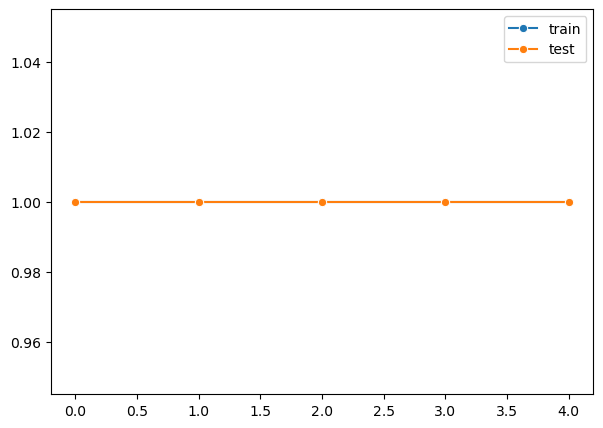

In [101]:
# plot trains vs test default
plt.figure(figsize=(7,5))
sns.lineplot(data = DT_kfold, label="train", marker="o")
sns.lineplot(data = DT_ts_kfold, label="test", marker="o")
plt.show()

In [102]:
# cek train score (mean)
DT_kfold.mean()

1.0

In [103]:
# cek test score (mean)
DT_ts_kfold.mean()

1.0

In [104]:
# score mean differences (<5 = bagus / goodfit = acceptable)
round((DT_kfold.mean() - DT_ts_kfold.mean())*100, 2)

0.0

### Random Forest

In [105]:
# model train dan fitting
RFC

RandomForestClassifier()

In [106]:
y_pred_rfc = RFC.predict(X_test)

In [107]:
result = pd.DataFrame()
result['y_act'] = y_test
result['y_pred_rfc'] = y_pred_rfc

In [108]:
result = pd.concat([X_test,result],axis=1)

In [109]:
result.head()

,Quantity,TotalCost,recency,frequency,monetary,RFMScore,cluster_km1,y_act,y_pred_rfc
35314,24,10.08,28,359.0,2655.22,211,0,0,0
176722,12,35.40,29,23.0,5842.95,241,0,0,0
284425,12,17.40,16,46.0,5055.79,141,0,0,0
296085,4,15.00,45,133.0,212.54,234,0,0,0
111142,3,14.85,22,58.0,3967.78,241,0,0,0


In [110]:
# buat kolom untuk nama feature dalam visualisasi
DT_cols = X_train_st.columns.tolist()

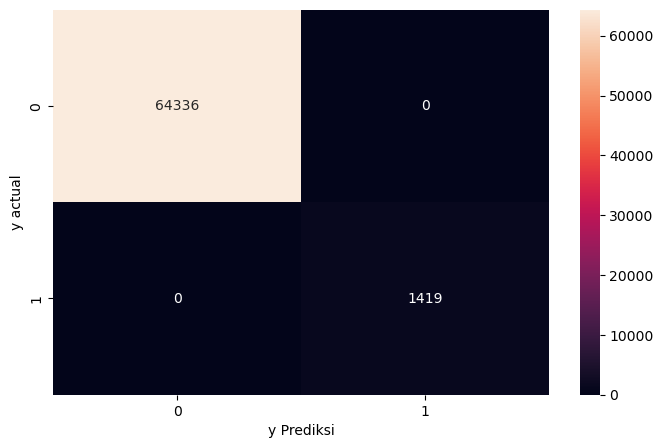

In [111]:
# cek hasil resampling dengan confusion matrix
f, ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_matrix(y_test, y_pred_rfc), annot=True, fmt='.0f', ax=ax)
plt.xlabel('y Prediksi')
plt.ylabel('y actual')
plt.show()

In [112]:
# cek classification report
print(classification_report(y_test, y_pred_rfc))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     64336
           1       1.00      1.00      1.00      1419

    accuracy                           1.00     65755
   macro avg       1.00      1.00      1.00     65755
weighted avg       1.00      1.00      1.00     65755



In [113]:
# fungsi untuk melakukan plot roc auc curve
def plot_roc_curve(true_y, y_prob, labels):
    
    fpr, tpr, thresholds = roc_curve(true_y, y_prob)
    
    plt.plot(fpr, tpr, label=labels)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')


model AUC score (hybrid resampling - SMOTE Tomek) : 1.0


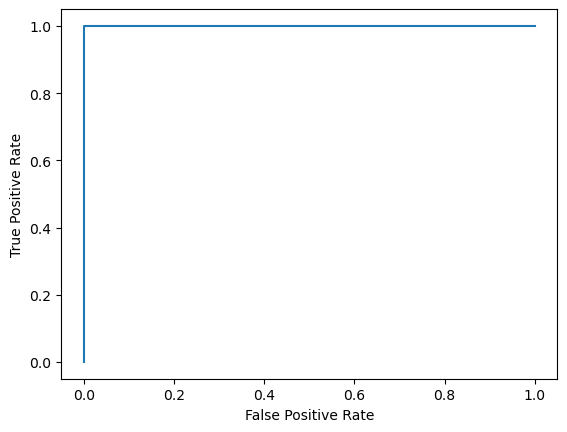

In [114]:
# plot roc auc setelah Resampling
plot_roc_curve(y_test, y_pred_rfc, "AUC SMOTE-Tomek")
print(f"\nmodel AUC score (hybrid resampling - SMOTE Tomek) : {roc_auc_score(y_test, y_pred_rfc)}")
plt.show()

In [115]:
# cek model matrices
pd.DataFrame(data = [accuracy_score(y_test, y_pred_rfc)*100, recall_score(y_test, y_pred_rfc)*100,
                     precision_score(y_test, y_pred_rfc)*100, roc_auc_score(y_test, y_pred_rfc)*100,
                     f1_score(y_test, y_pred_rfc)*100],
             index = ['accuracy', 'recall', 'precision', 'roc_auc_score', 'f1_score'],
             columns = ['Score (%)']
            )

,Score (%)
accuracy,100.0
recall,100.0
precision,100.0
roc_auc_score,100.0
f1_score,100.0


In [116]:
# cek 1 fold cross val
pd.DataFrame(data = [RFC.score(X_train_st, y_train_st)*100,
                     RFC.score(X_test, y_test)*100],
             index = ['Model Score in Data Train', 'Model Score in Data Test'],
             columns = ['Score (%)']
            )

,Score (%)
Model Score in Data Train,100.0
Model Score in Data Test,100.0


In [117]:
# Check overfit on Random Forest Classifier

cv = KFold(n_splits = 5, shuffle= True)

RFC_kfold = cross_val_score(RFC, X_train_st, y_train_st, cv = cv)
RFC_ts_kfold = cross_val_score(RFC, X_test, y_test, cv = cv)

pd.DataFrame({'LR Train kfold' : RFC_kfold.tolist(),
             'LR Test kfold' : RFC_ts_kfold.tolist(),})

,LR Train kfold,LR Test kfold
0,1.0,1.0
1,1.0,1.0
2,1.0,1.0
3,1.0,1.0
4,1.0,1.0


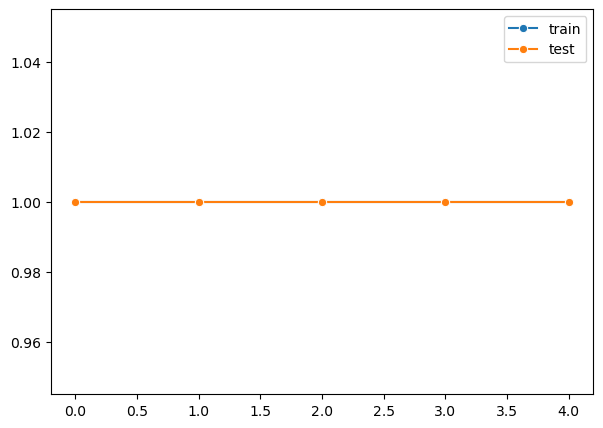

In [118]:
# plot trains vs test default
plt.figure(figsize=(7,5))
sns.lineplot(data = DT_kfold, label="train", marker="o")
sns.lineplot(data = DT_ts_kfold, label="test", marker="o")
plt.show()

In [119]:
# cek train score (mean)
RFC_kfold.mean()

1.0

In [120]:
# cek test score (mean)
RFC_ts_kfold.mean()

1.0

In [121]:
# score mean differences (<5 = bagus / goodfit = acceptable)
round((RFC_kfold.mean() - RFC_ts_kfold.mean())*100, 2)

0.0

## Summary

>Recommendation for  each cluster 

>0 customer with high cancellation and are the most of population, we could make a discount for the top 3 items most bought e.g.: T-Heart Holder, Regency cakestand 3 tier, jumbo bag retrospot. 

> For cluster 1(The Best Customers) with high quantity purchase and high total cost and high recency we could make bundling promo to encourage them and loyalty points for their consistent purchase and big spend , the bundling/discount includes the top 3 products are spaceboy lunch box, round snack box set of 4 box, postage.


> For cluster 2(The big spenders and a bit of best customers), we could give discount the top 3 products are regency cakestand 3 tier, jumbo bag red retrospot, carriage


> For cluster 3(The big spenders and a bit of best customers), we could give discount the top 3 products are regency cakestand 3 tier, jumbo bag red retrospot, lunch bag re retrospot


> Most of em listed on top product sold as a whole population